<a href="https://colab.research.google.com/github/Uemerson/image-registration-tests/blob/main/voxelmorph_multi_temporal_aerial_image_pairs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install necessary libs

In [5]:
!pip install pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
# install voxelmorph, which will also install dependencies: neurite and pystrum
!pip install voxelmorph

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import necessary libs

In [8]:
# imports
import os, sys
import glob

# third party imports
import numpy as np
%tensorflow_version 2.x
import tensorflow as tf
assert tf.__version__.startswith('2.'), 'This tutorial assumes Tensorflow 2.0+'

# local imports
import voxelmorph as vxm
import neurite as ne

from google.colab import drive
import matplotlib.pyplot as plt  # Just so we can visually confirm we have the same images
%matplotlib inline
from PIL import Image
from zipfile import ZipFile
import io
import time
from patchify import patchify, unpatchify

#Enabling and testing the GPU

In [9]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


# Connect with google drive

In [10]:
# mount drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Images 2D

## Convert images to numpy arrays (npz)

In [ ]:
colab_dataset_path = "/content/gdrive/My Drive/Colab Notebooks/image-registration/datasets/multi-temporal-aerial-image-pairs"
past_dataset = ZipFile(f'{colab_dataset_path}/past-dataset.zip', 'r')
current_dataset = ZipFile(f'{colab_dataset_path}/current-dataset.zip', 'r')

train_images = []
size = 256, 256
# size = 512, 512

i=0
for filename in past_dataset.namelist():
  if filename.startswith("Train/") and filename != "Train/":
    # past
    train_image = Image.open(io.BytesIO(past_dataset.read(filename))).convert('L')
    train_image.thumbnail(size, Image.ANTIALIAS)
    train_images.append(np.array(train_image))
    # current
    train_image = Image.open(io.BytesIO(current_dataset.read(filename))).convert('L')
    train_image.thumbnail(size, Image.ANTIALIAS)
    train_images.append(np.array(train_image))
    i=i+1

  # if i>=1000:
  #   break

np.savez("train.npz", train=train_images)

## Load dataset

In [ ]:
train = np.load('train.npz')
x_train = train['train']

print('type of x_train: {}'.format(type(x_train)))
print('shape of x_train: {}'.format(x_train.shape))

type of x_train: <class 'numpy.ndarray'>
shape of x_train: (18000, 256, 256)


## VoxelMorph

### Visualize Data

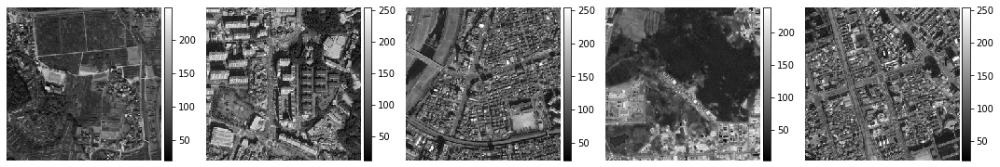

In [ ]:
nb_vis = 5

# choose nb_vis sample indexes
idx = np.random.choice(x_train.shape[0], nb_vis, replace=False)
example_images = [f for f in x_train[idx, ...]]

# plot
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

## Display size of all variables

In [ ]:
import sys
def sizeof_fmt(num, suffix='B'):
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

# local_vars = list(locals().items())
# for var, obj in local_vars:
#     print(var, sizeof_fmt(sys.getsizeof(obj)))

                       x_train:  8.8 GiB
                       ZipFile:  1.4 KiB
                          _iii:  623.0 B
                           _i2:  623.0 B
                           _i5:  623.0 B
                           _i9:  623.0 B
                          _i11:  623.0 B
                          _i14:  623.0 B
                           _i3:  532.0 B
                           _i6:  278.0 B


### Normalized

In [ ]:
def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [ ]:
# fix data
x_train = x_train.astype('float')/255
# scaled_x = NormalizeData(x_train)

# verify
print('training maximum value', x_train.max())

training maximum value 1.0


### Re-visualize

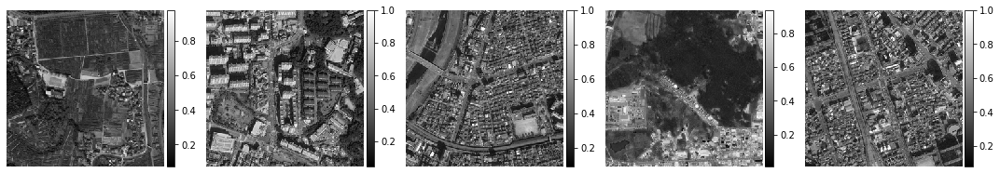

In [ ]:
example_images = [f for f in x_train[idx, ...]]
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

### Prepare model checkpoint save path

In [ ]:
# prepare model folder
model_dir = 'checkpoints'
gpu = '0'
os.makedirs(model_dir, exist_ok=True)

# tensorflow device handling
device, nb_devices = vxm.tf.utils.setup_device(gpu)
batch_size=32
assert np.mod(batch_size, nb_devices) == 0, \
    'Batch size (%d) should be a multiple of the nr of gpus (%d)' % (batch_size, nb_devices)

# prepare model checkpoint save path
save_filename = os.path.join(model_dir, '{epoch:04d}.h5')

### CNN Model

In [ ]:
initial_epoch=0

# configure unet features (unet architecture)
nb_features = [
    [32, 32, 32, 32],         # encoder features
    [32, 32, 32, 32, 32, 16]  # decoder features
]

# configure unet input shape (concatenation of moving and fixed images)
inshape = (256,256)

# build model
vxm_model = vxm.networks.VxmDense(inshape, nb_features)

print('input shape: ', ', '.join([str(t.shape) for t in vxm_model.inputs]))
print('output shape:', ', '.join([str(t.shape) for t in vxm_model.outputs]))

# voxelmorph has a variety of custom loss classes
losses = [vxm.losses.MSE().loss, vxm.losses.Grad('l2').loss]

# usually, we have to balance the two losses by a hyper-parameter
lambda_param = 0.05
loss_weights = [1, lambda_param]

# multi-gpu support
if nb_devices > 1:
    save_callback = vxm.networks.ModelCheckpointParallel(save_filename)
    model = tf.keras.utils.multi_gpu_model(vxm_model, gpus=nb_devices)
else:
    save_callback = tf.keras.callbacks.ModelCheckpoint(save_filename, period=20)

vxm_model.compile(optimizer='Adam', loss=losses, loss_weights=loss_weights)

# save starting weights
vxm_model.save(save_filename.format(epoch=initial_epoch))

input shape:  (None, 256, 256, 1), (None, 256, 256, 1)
output shape: (None, 256, 256, 1), (None, 128, 128, 2)


### Train Model

In [ ]:
def vxm_data_generator(x_data, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ..., np.newaxis]
        inputs = [moving_images, fixed_images]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

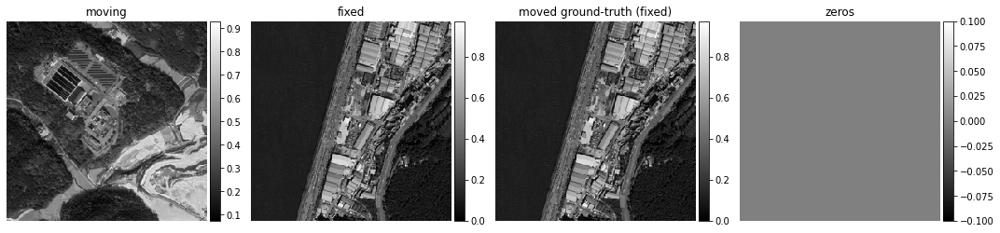

In [ ]:
# let's test it
train_generator = vxm_data_generator(x_train)
in_sample, out_sample = next(train_generator)

# visualize
images = [img[0, :, :, 0] for img in in_sample + out_sample] 
titles = ['moving', 'fixed', 'moved ground-truth (fixed)', 'zeros']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

In [ ]:
nb_epochs = 10
steps_per_epoch = 100
with tf.device('/device:GPU:0'):
  hist = vxm_model.fit_generator(train_generator, 
                                 epochs=nb_epochs, 
                                 initial_epoch=initial_epoch,
                                 steps_per_epoch=steps_per_epoch, 
                                 verbose=2, 
                                 callbacks=[save_callback]);
vxm_model.save(os.path.join(model_dir, f'epochs-{nb_epochs}-steps_per_epoch{steps_per_epoch}-batch_size-32.h5'))

Epoch 1/10


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  if __name__ == '__main__':


100/100 - 95s - loss: 0.0601 - vxm_dense_transformer_loss: 0.0583 - vxm_dense_flow_resize_loss: 0.0359 - 95s/epoch - 953ms/step
Epoch 2/10
100/100 - 68s - loss: 0.0532 - vxm_dense_transformer_loss: 0.0480 - vxm_dense_flow_resize_loss: 0.1034 - 68s/epoch - 682ms/step
Epoch 3/10
100/100 - 68s - loss: 0.0514 - vxm_dense_transformer_loss: 0.0456 - vxm_dense_flow_resize_loss: 0.1161 - 68s/epoch - 679ms/step
Epoch 4/10
100/100 - 68s - loss: 0.0509 - vxm_dense_transformer_loss: 0.0447 - vxm_dense_flow_resize_loss: 0.1233 - 68s/epoch - 678ms/step
Epoch 5/10
100/100 - 68s - loss: 0.0505 - vxm_dense_transformer_loss: 0.0442 - vxm_dense_flow_resize_loss: 0.1262 - 68s/epoch - 682ms/step
Epoch 6/10
100/100 - 68s - loss: 0.0502 - vxm_dense_transformer_loss: 0.0438 - vxm_dense_flow_resize_loss: 0.1285 - 68s/epoch - 683ms/step
Epoch 7/10
100/100 - 68s - loss: 0.0501 - vxm_dense_transformer_loss: 0.0436 - vxm_dense_flow_resize_loss: 0.1300 - 68s/epoch - 682ms/step
Epoch 8/10
100/100 - 68s - loss: 0.049

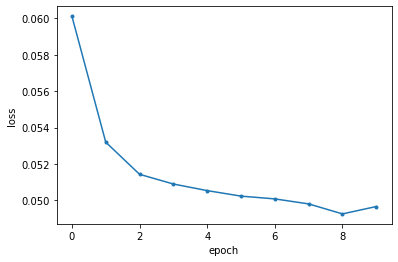

In [ ]:
import matplotlib.pyplot as plt

def plot_history(hist, loss_name='loss'):
    # Simple function to plot training history.
    plt.figure()
    plt.plot(hist.epoch, hist.history[loss_name], '.-')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

plot_history(hist)

### Registration

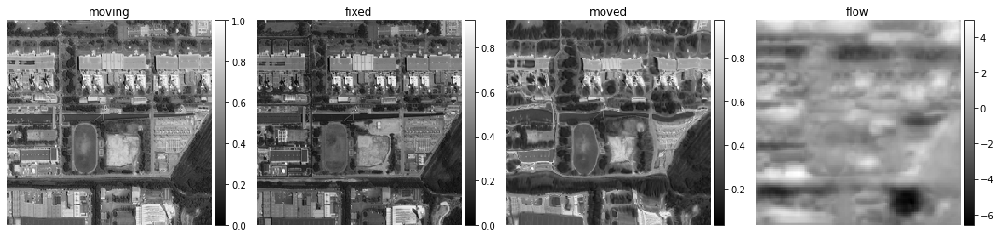

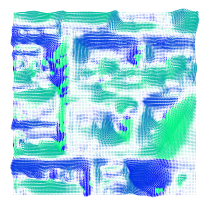

Reg Time: 0.0739
Dice: 1.0000 +/- 0.0000


In [ ]:
i = 0
for filename in past_dataset.namelist():
  if filename.startswith("Val/") and filename != "Val/" and i<=0:
    i = i + 1
    val_images = []
    # past
    val_image = Image.open(io.BytesIO(past_dataset.read(filename))).convert('L')
    val_image.thumbnail(size, Image.ANTIALIAS)
    val_images.append(np.array(val_image))
    # current
    val_image = Image.open(io.BytesIO(current_dataset.read(filename))).convert('L')
    val_image.thumbnail(size, Image.ANTIALIAS)
    val_images.append(np.array(val_image))
    np.savez("val.npz", val=val_images)
    val = np.load('val.npz')
    x_val = val['val']
    # fix data
    x_val = x_val.astype('float')/255
    with tf.device(device):
      # let's get some data
      val_generator = vxm_data_generator(x_val, batch_size = 1)
      val_input, _ = next(val_generator)
      # predict warp and time
      start = time.time()
      val_pred = vxm_model.predict(val_input)
      reg_time = time.time() - start

      # visualize colored
      moving_colored = val_input[0][0]
      fixed_colored = val_input[1][0]
      moved_colored = val_pred[0][0]
      flow = [img[:, :, 0] for img in val_pred[1]]
      titles = ['moving', 'fixed', 'moved', 'flow']

      images = [moving_colored, fixed_colored, moved_colored, flow]
      ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

      ne.plot.flow([val_pred[1].squeeze()], width=3);
      
      # compute volume overlap (dice)
      # overlap = vxm.py.utils.dice(warped_seg, fixed_seg)
      overlap = vxm.py.utils.dice(val_pred[0][0], val_input[1][0])
      # overlap = vxm.py.utils.dice(val_pred, val_input)
      print('Reg Time: %.4f' % reg_time)
      print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

In [ ]:
# let's get some data
val_generator = vxm_data_generator(x_val, batch_size = 1)
val_input, _ = next(val_generator)

val_pred = vxm_model.predict(val_input)

In [ ]:
# %timeit is a 'jupyter magic' that times the given line over several runs
%timeit vxm_model.predict(val_input)

10 loops, best of 5: 40.6 ms per loop


### Visualize

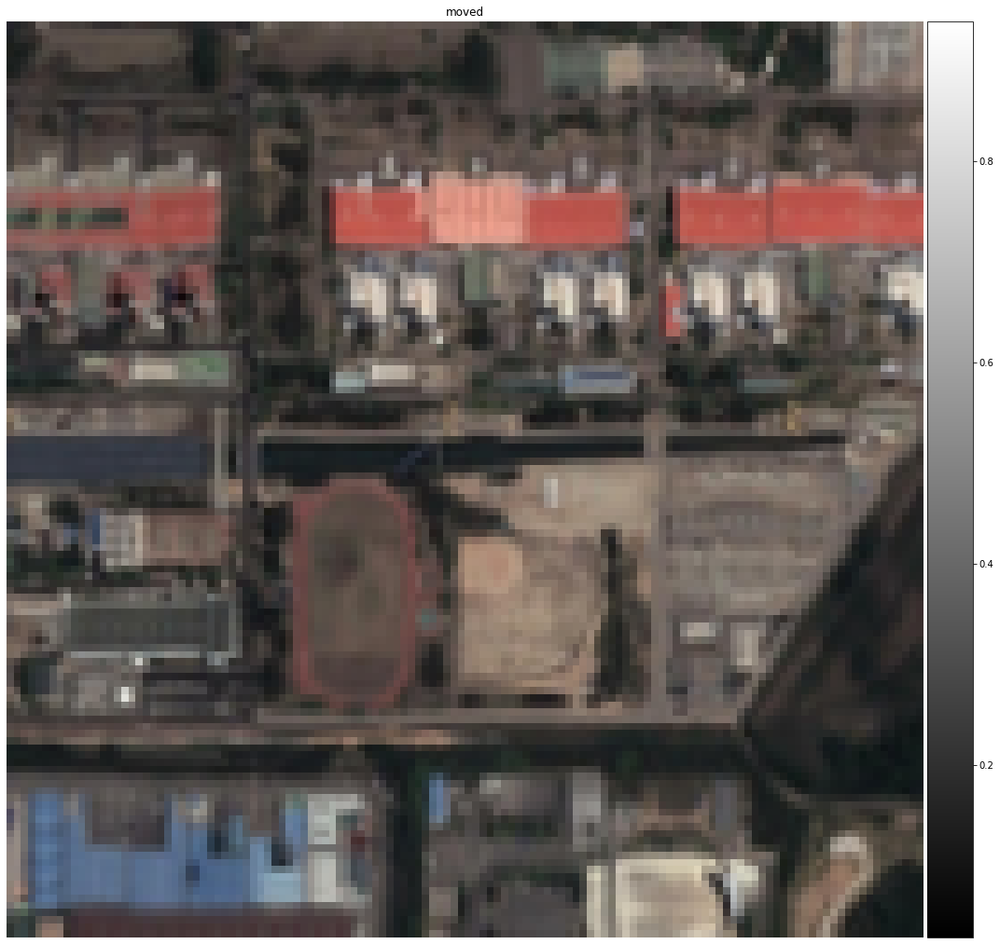

In [ ]:
images = [val_pred[0][0]]
titles = ['moved']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

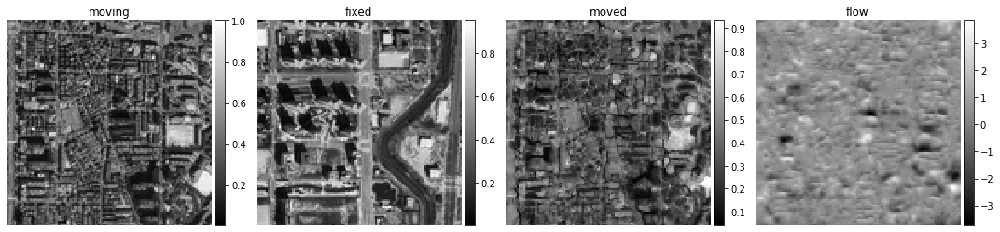

In [ ]:
# visualize
images = [img[0, :, :, 0] for img in val_input + val_pred]
titles = ['moving', 'fixed', 'moved', 'flow']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

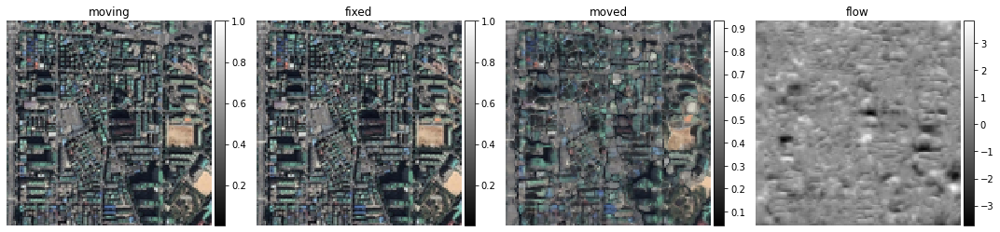

In [ ]:
# visualize colored
moving_colored = val_input[0][0]
fixed_colored = val_input[0][0]
moved_colored = val_pred[0][0]
flow = [img[:, :, 0] for img in val_pred[1]]
titles = ['moving', 'fixed', 'moved', 'flow']

images = [moving_colored, fixed_colored, moved_colored, flow]
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

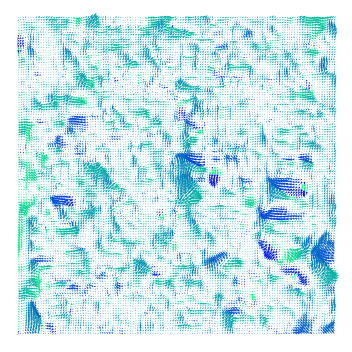

In [ ]:
ne.plot.flow([val_pred[1].squeeze()], width=5);

### Dice Score

In [ ]:
overlap = vxm.py.utils.dice(val_pred[0], val_input[1])
print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

Dice: 0.0000 +/- 0.0000


# Images 3D

## Convert images to numpy arrays (npz)

In [ ]:
colab_dataset_path = "/content/gdrive/My Drive/Colab Notebooks/image-registration/datasets/multi-temporal-aerial-image-pairs"
past_dataset = ZipFile(f'{colab_dataset_path}/past-dataset.zip', 'r')
current_dataset = ZipFile(f'{colab_dataset_path}/current-dataset.zip', 'r')

train_images = []
size = 1024, 1024

i=0
for filename in past_dataset.namelist():
  if filename.startswith("Train/") and filename != "Train/":
    # past
    train_image = Image.open(io.BytesIO(past_dataset.read(filename)))
    train_image.thumbnail(size, Image.ANTIALIAS)
    train_images.append(np.array(train_image))
    # current
    train_image = Image.open(io.BytesIO(current_dataset.read(filename)))
    train_image.thumbnail(size, Image.ANTIALIAS)
    train_images.append(np.array(train_image))
    i=i+1

  if i>=2:
    break

np.savez("train.npz", train=train_images)

## Load dataset

In [ ]:
train = np.load('train.npz')
x_train = train['train']

print('type of x_train: {}'.format(type(x_train)))
print('shape of x_train: {}'.format(x_train.shape))

type of x_train: <class 'numpy.ndarray'>
shape of x_train: (4, 1024, 1024, 3)


## VoxelMorph

### Visualize Data

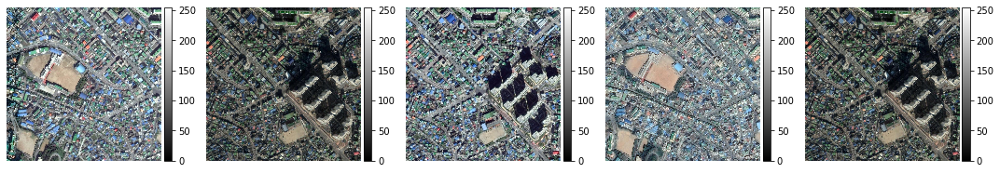

In [ ]:
nb_vis = 5

# choose nb_vis sample indexes
idx = np.random.choice(x_train.shape[0], nb_vis, replace=False)
example_images = [f for f in x_train[idx, ...]]

# plot
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

### Normalized

In [ ]:
# fix data
x_train = x_train.astype('float')/255

# verify
print('training maximum value', x_train.max())

training maximum value 1.0


### Re-visualize

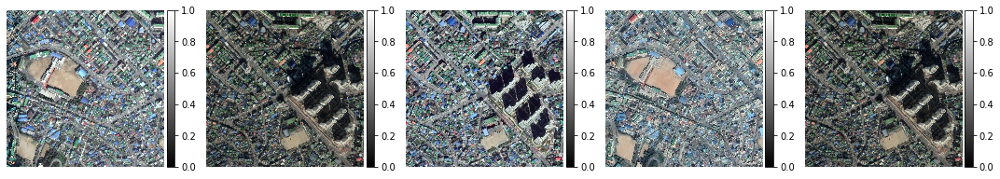

In [ ]:
example_images = [f for f in x_train[idx, ...]]
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

### Prepare model checkpoint save path

In [ ]:
# prepare model folder
model_dir = 'checkpoints'
gpu = '0'
os.makedirs(model_dir, exist_ok=True)

# tensorflow device handling
device, nb_devices = vxm.tf.utils.setup_device(gpu)
batch_size=32
assert np.mod(batch_size, nb_devices) == 0, \
    'Batch size (%d) should be a multiple of the nr of gpus (%d)' % (batch_size, nb_devices)

# prepare model checkpoint save path
save_filename = os.path.join(model_dir, '{epoch:04d}.h5')

### CNN Model

In [ ]:
initial_epoch=0

# configure unet features (unet architecture)
nb_features = [
    [32, 32, 32, 32],         # encoder features
    [32, 32, 32, 32, 32, 16]  # decoder features
]

# build model using VxmDense
inshape = x_train.shape[1:-1]

vxm_model = vxm.networks.VxmDense(inshape, nb_features, int_steps=7, src_feats=3, trg_feats=3)

print('input shape: ', ', '.join([str(t.shape) for t in vxm_model.inputs]))
print('output shape:', ', '.join([str(t.shape) for t in vxm_model.outputs]))

# voxelmorph has a variety of custom loss classes
losses = [vxm.losses.MSE().loss, vxm.losses.Grad('l2').loss]

# usually, we have to balance the two losses by a hyper-parameter
lambda_param = 0.05
loss_weights = [1, lambda_param]

# multi-gpu support
if nb_devices > 1:
    save_callback = vxm.networks.ModelCheckpointParallel(save_filename)
    model = tf.keras.utils.multi_gpu_model(vxm_model, gpus=nb_devices)
else:
    save_callback = tf.keras.callbacks.ModelCheckpoint(save_filename, period=20)

vxm_model.compile(optimizer='Adam', loss=losses, loss_weights=loss_weights)

# save starting weights
vxm_model.save(save_filename.format(epoch=initial_epoch))

input shape:  (None, 1024, 1024, 3), (None, 1024, 1024, 3)
output shape: (None, 1024, 1024, 3), (None, 512, 512, 2)


### Train Model

In [ ]:
def vxm_data_generator(x_data, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ...]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ...]
        inputs = [moving_images, fixed_images]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

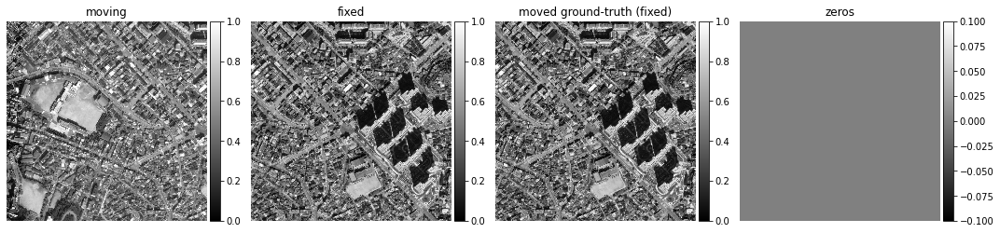

In [ ]:
# let's test it
train_generator = vxm_data_generator(x_train)
in_sample, out_sample = next(train_generator)

# visualize
images = [img[0, :, :, 0] for img in in_sample + out_sample] 
titles = ['moving', 'fixed', 'moved ground-truth (fixed)', 'zeros']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

In [ ]:
nb_epochs = 10
steps_per_epoch = 100
with tf.device('/device:GPU:0'):
  hist = vxm_model.fit_generator(train_generator, 
                                 epochs=nb_epochs, 
                                 initial_epoch=initial_epoch,
                                 steps_per_epoch=steps_per_epoch, 
                                 verbose=2, 
                                 callbacks=[save_callback]);
vxm_model.save(os.path.join(model_dir, f'epochs-{nb_epochs}-steps_per_epoch{steps_per_epoch}-batch_size-32.h5'))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  if __name__ == '__main__':


Epoch 1/10


ResourceExhaustedError: ignored

In [ ]:
import matplotlib.pyplot as plt

def plot_history(hist, loss_name='loss'):
    # Simple function to plot training history.
    plt.figure()
    plt.plot(hist.epoch, hist.history[loss_name], '.-')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

plot_history(hist)

### Registration

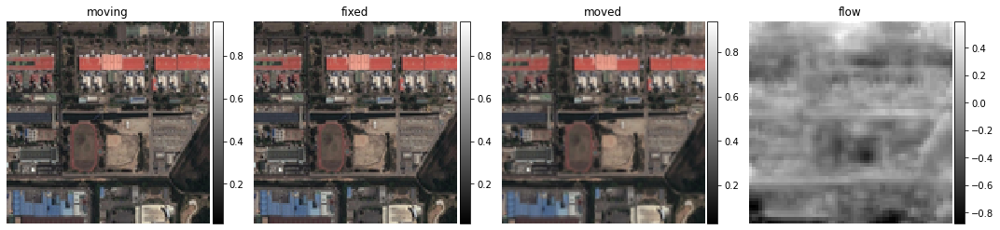

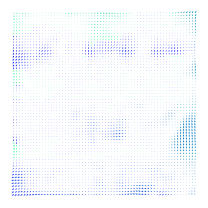

Dice: 0.0755 +/- 0.0788
Reg Time: 0.0601
Dice: 0.0000 +/- 0.0002


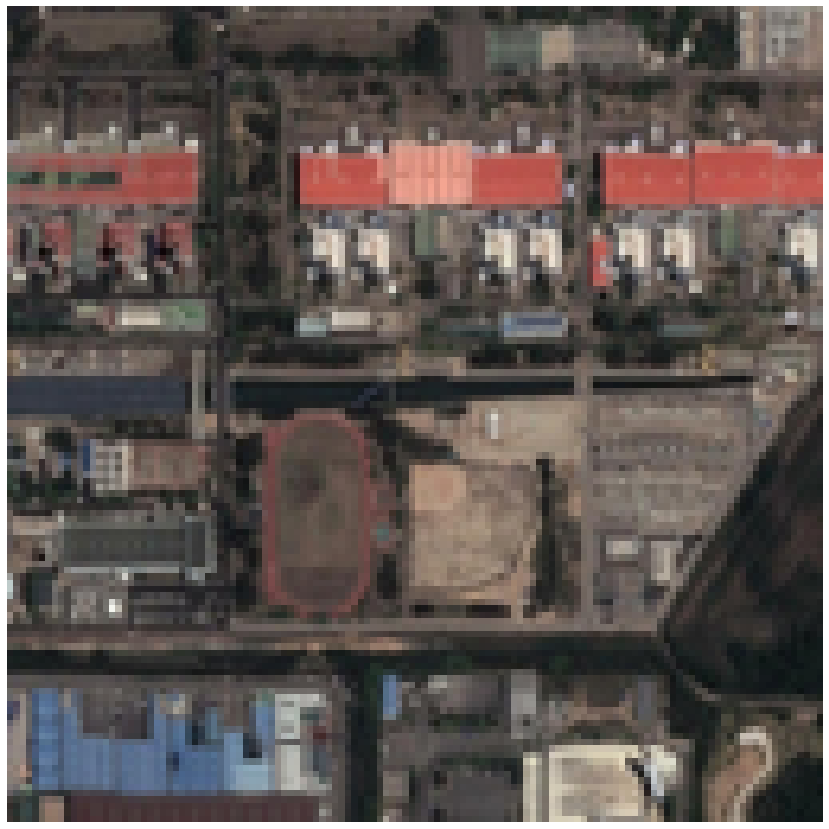

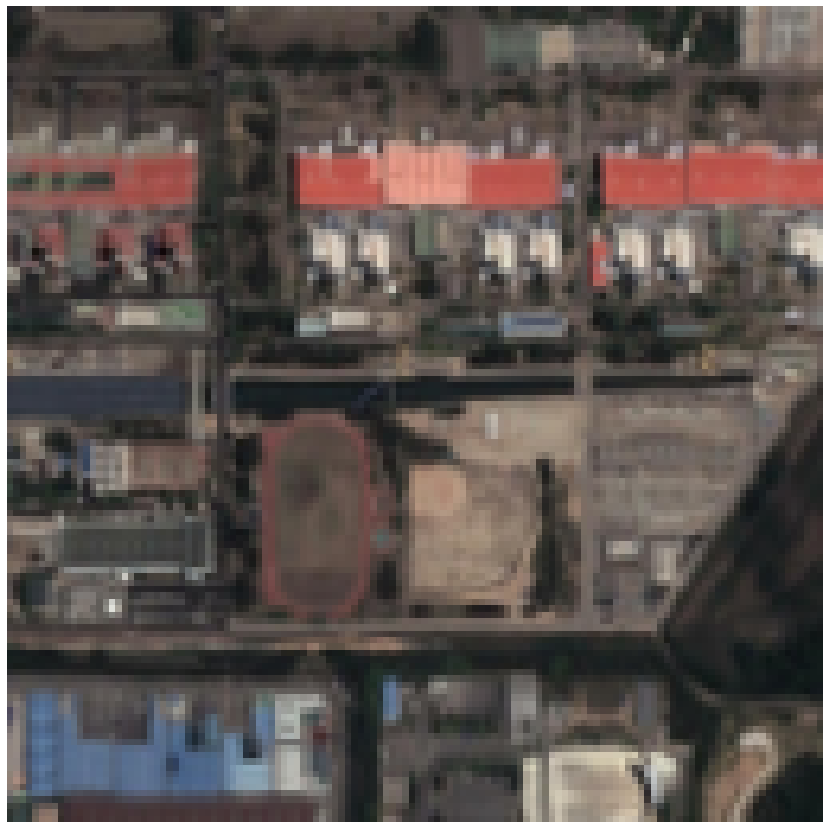

In [ ]:
i = 0
for filename in past_dataset.namelist():
  if filename.startswith("Val/") and filename != "Val/" and i<=0:
    i = i + 1
    val_images = []
    # past
    val_image = Image.open(io.BytesIO(past_dataset.read(filename)))
    val_image.thumbnail(size, Image.ANTIALIAS)
    val_images.append(np.array(val_image))
    # current
    val_image = Image.open(io.BytesIO(current_dataset.read(filename)))
    val_image.thumbnail(size, Image.ANTIALIAS)
    val_images.append(np.array(val_image))
    np.savez("val.npz", val=val_images)
    val = np.load('val.npz')
    x_val = val['val']
    # fix data
    x_val = x_val.astype('float')/255
    with tf.device(device):
      # let's get some data
      val_generator = vxm_data_generator(x_val, batch_size = 1)
      val_input, _ = next(val_generator)
      # predict warp and time
      start = time.time()
      val_pred = vxm_model.predict(val_input)
      reg_time = time.time() - start

      # visualize colored
      moving_colored = val_input[0][0]
      fixed_colored = val_input[1][0]
      moved_colored = val_pred[0][0]
      flow = [img[:, :, 0] for img in val_pred[1]]
      titles = ['moving', 'fixed', 'moved', 'flow']

      images = [moving_colored, fixed_colored, moved_colored, flow]
      ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

      ne.plot.flow([val_pred[1].squeeze()], width=3);
      
      images = [fixed_colored]
      fixed, _ = ne.plot.slices(images, show=False);
      fixed.savefig('fixed.jpg')
      fixed = np.array(Image.open('fixed.jpg'))

      images = [moved_colored]
      moved, _ = ne.plot.slices(images, show=False);
      moved.savefig('moved.jpg')
      moved = np.array(Image.open('moved.jpg'))

      overlap = vxm.py.utils.dice(fixed, moved)
      print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

      # compute volume overlap (dice)
      # overlap = vxm.py.utils.dice(warped_seg, fixed_seg)
      overlap = vxm.py.utils.dice(val_pred[0][0], val_input[1][0])
      # overlap = vxm.py.utils.dice(val_pred, val_input)
      print('Reg Time: %.4f' % reg_time)
      print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

In [ ]:
# let's get some data
val_generator = vxm_data_generator(x_val, batch_size = 1)
val_input, _ = next(val_generator)

val_pred = vxm_model.predict(val_input)

In [ ]:
# %timeit is a 'jupyter magic' that times the given line over several runs
%timeit vxm_model.predict(val_input)

10 loops, best of 5: 40.6 ms per loop


### Visualize

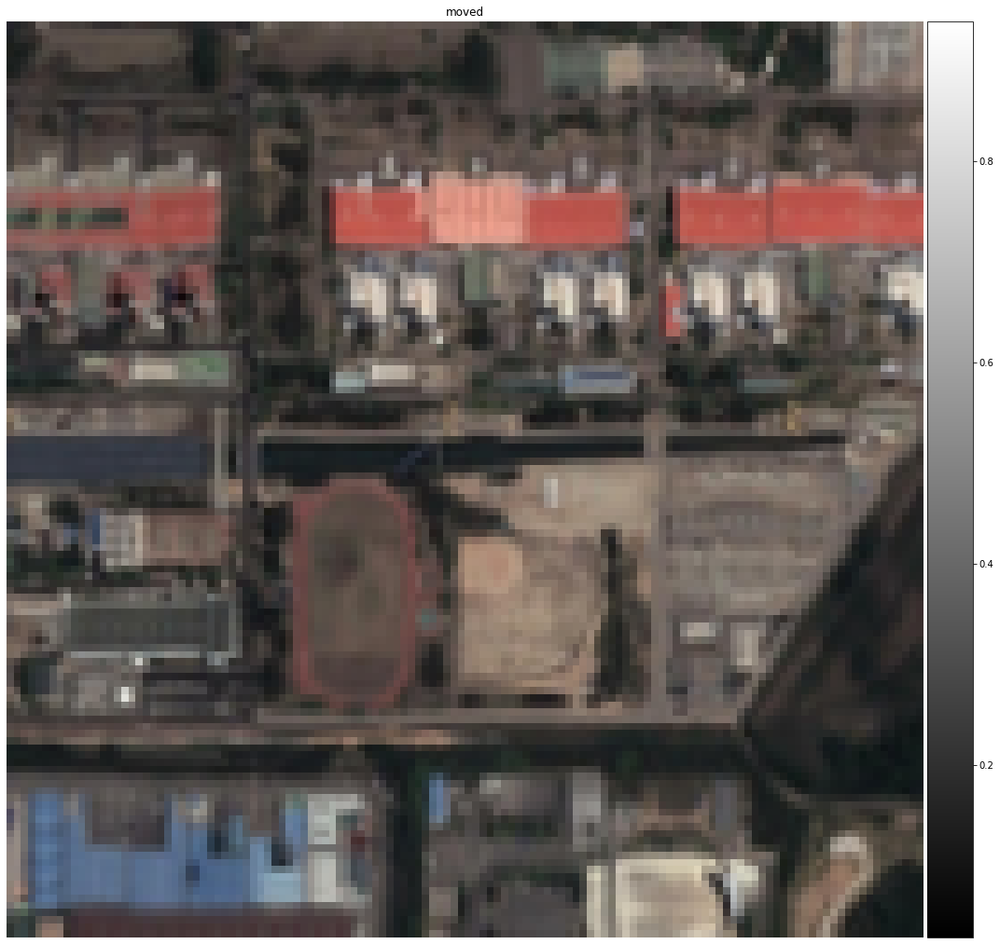

In [ ]:
images = [val_pred[0][0]]
titles = ['moved']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

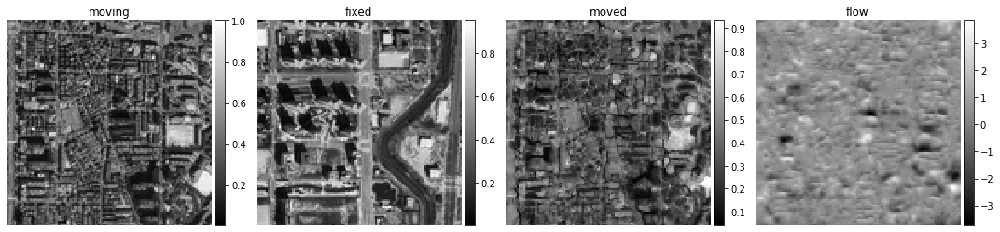

In [ ]:
# visualize
images = [img[0, :, :, 0] for img in val_input + val_pred]
titles = ['moving', 'fixed', 'moved', 'flow']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

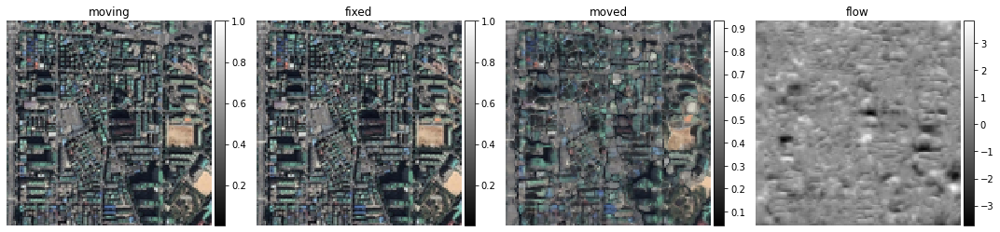

In [ ]:
# visualize colored
moving_colored = val_input[0][0]
fixed_colored = val_input[0][0]
moved_colored = val_pred[0][0]
flow = [img[:, :, 0] for img in val_pred[1]]
titles = ['moving', 'fixed', 'moved', 'flow']

images = [moving_colored, fixed_colored, moved_colored, flow]
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

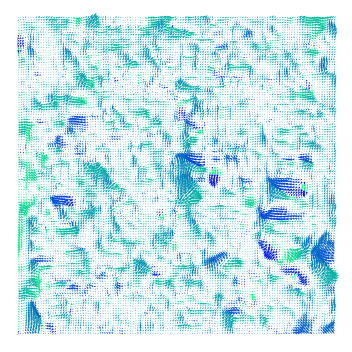

In [ ]:
ne.plot.flow([val_pred[1].squeeze()], width=5);

### Dice Score

In [ ]:
overlap = vxm.py.utils.dice(val_pred[0], val_input[1])
print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

Dice: 0.0000 +/- 0.0000


# Images 3D Patchify

## Utils

In [11]:
def dice_coef(y_true, y_pred):
    y_true_f = tf.reshape(tf.dtypes.cast(y_true, tf.float32), [-1])
    y_pred_f = tf.reshape(tf.dtypes.cast(y_pred, tf.float32), [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + 1.) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1.)

In [12]:
def plot_image(image, title):
    # showing image
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)
    plt.show()

## Convert images to numpy arrays (npz)

In [13]:
colab_dataset_path = "/content/gdrive/My Drive/Colab Notebooks/image-registration/datasets/multi-temporal-aerial-image-pairs"
past_dataset = ZipFile(f'{colab_dataset_path}/past-dataset.zip', 'r')
current_dataset = ZipFile(f'{colab_dataset_path}/current-dataset.zip', 'r')

train_images = []
size = 1024, 1024

count=0
for filename in past_dataset.namelist():
  if filename.startswith("Train/") and filename != "Train/":
    # past
    train_image = Image.open(io.BytesIO(past_dataset.read(filename)))
    train_image.thumbnail(size, Image.ANTIALIAS)

    # showing image
    # plt.imshow(train_image)
    # plt.axis('off')
    # plt.title("train_image")
    # plt.show()

    patches = patchify(np.array(train_image), (256, 256, 3), step=256)
    
    for i in range(patches.shape[0]):
      for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        train_images.append(single_patch[0])
        # showing image
        # plt.imshow(single_patch[0])
        # plt.axis('off')
        # plt.title(f"i: {i}, j: {j}")
        # plt.show()

    # current
    train_image = Image.open(io.BytesIO(current_dataset.read(filename)))
    train_image.thumbnail(size, Image.ANTIALIAS)
    patches = patchify(np.array(train_image), (256, 256, 3), step=256)
    
    for i in range(patches.shape[0]):
      for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        train_images.append(single_patch[0])

    count=count+1

  if count>=10:
    break

np.savez("train.npz", train=train_images)

## Load dataset

In [14]:
train = np.load('train.npz')
x_train = train['train']

print('type of x_train: {}'.format(type(x_train)))
print('shape of x_train: {}'.format(x_train.shape))

type of x_train: <class 'numpy.ndarray'>
shape of x_train: (320, 256, 256, 3)


## VoxelMorph

### Visualize Data

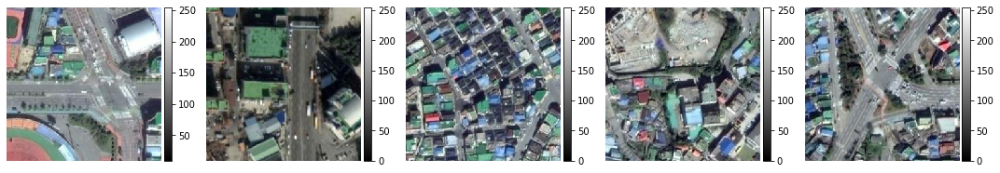

In [15]:
nb_vis = 5

# choose nb_vis sample indexes
idx = np.random.choice(x_train.shape[0], nb_vis, replace=False)
example_images = [f for f in x_train[idx, ...]]

# plot
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

### Normalized

In [16]:
# fix data
x_train = x_train.astype('float')/255

# verify
print('training maximum value', x_train.max())

training maximum value 1.0


### Re-visualize

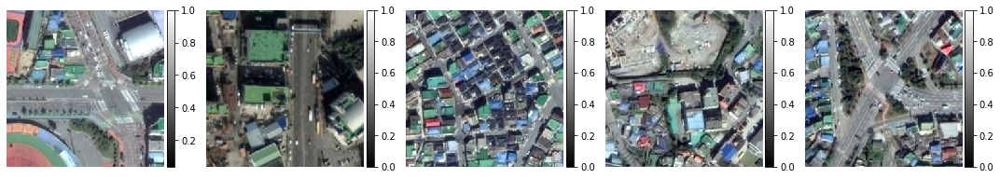

In [17]:
example_images = [f for f in x_train[idx, ...]]
ne.plot.slices(example_images, cmaps=['gray'], do_colorbars=True);

### Prepare model checkpoint save path

In [18]:
# prepare model folder
model_dir = 'checkpoints'
gpu = '0'
os.makedirs(model_dir, exist_ok=True)

# tensorflow device handling
device, nb_devices = vxm.tf.utils.setup_device(gpu)
batch_size=32
assert np.mod(batch_size, nb_devices) == 0, \
    'Batch size (%d) should be a multiple of the nr of gpus (%d)' % (batch_size, nb_devices)

# prepare model checkpoint save path
save_filename = os.path.join(model_dir, '{epoch:04d}.h5')

### CNN Model

In [19]:
initial_epoch=0

# configure unet features (unet architecture)
nb_features = [
    [32, 32, 32, 32],         # encoder features
    [32, 32, 32, 32, 32, 16]  # decoder features
]

# build model using VxmDense
inshape = x_train.shape[1:-1]

vxm_model = vxm.networks.VxmDense(inshape, nb_features, int_steps=7, src_feats=3, trg_feats=3)

print('input shape: ', ', '.join([str(t.shape) for t in vxm_model.inputs]))
print('output shape:', ', '.join([str(t.shape) for t in vxm_model.outputs]))

# voxelmorph has a variety of custom loss classes
losses = [vxm.losses.MSE().loss, vxm.losses.Grad('l2').loss]

# usually, we have to balance the two losses by a hyper-parameter
lambda_param = 0.05
loss_weights = [1, lambda_param]

# multi-gpu support
if nb_devices > 1:
    save_callback = vxm.networks.ModelCheckpointParallel(save_filename)
    model = tf.keras.utils.multi_gpu_model(vxm_model, gpus=nb_devices)
else:
    save_callback = tf.keras.callbacks.ModelCheckpoint(save_filename, period=20)

vxm_model.compile(optimizer='Adam', loss=losses, loss_weights=loss_weights)

# save starting weights
vxm_model.save(save_filename.format(epoch=initial_epoch))

input shape:  (None, 256, 256, 3), (None, 256, 256, 3)
output shape: (None, 256, 256, 3), (None, 128, 128, 2)


### Train Model

In [20]:
def vxm_data_generator(x_data, batch_size=32):
    """
    Generator that takes in data of size [N, H, W], and yields data for
    our custom vxm model. Note that we need to provide numpy data for each
    input, and each output.

    inputs:  moving [bs, H, W, 1], fixed image [bs, H, W, 1]
    outputs: moved image [bs, H, W, 1], zero-gradient [bs, H, W, 2]
    """

    # preliminary sizing
    vol_shape = x_data.shape[1:] # extract data shape
    ndims = len(vol_shape)
    
    # prepare a zero array the size of the deformation
    # we'll explain this below
    zero_phi = np.zeros([batch_size, *vol_shape])
    
    while True:
        # prepare inputs:
        # images need to be of the size [batch_size, H, W, 1]
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ...]
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        fixed_images = x_data[idx2, ...]
        inputs = [moving_images, fixed_images]
        
        # prepare outputs (the 'true' moved image):
        # of course, we don't have this, but we know we want to compare 
        # the resulting moved image with the fixed image. 
        # we also wish to penalize the deformation field. 
        outputs = [fixed_images, zero_phi]
        
        yield (inputs, outputs)

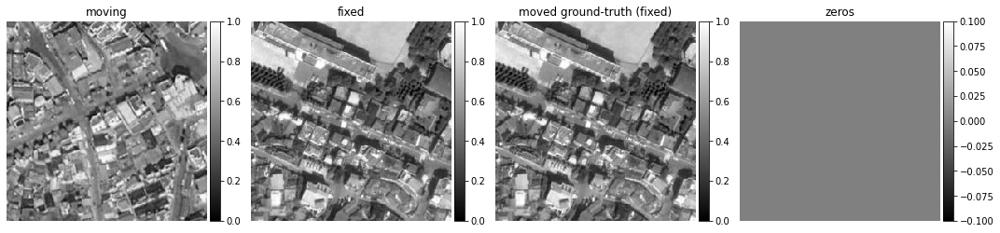

In [21]:
# let's test it
train_generator = vxm_data_generator(x_train)
in_sample, out_sample = next(train_generator)

# visualize
images = [img[0, :, :, 0] for img in in_sample + out_sample] 
titles = ['moving', 'fixed', 'moved ground-truth (fixed)', 'zeros']
ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

In [22]:
nb_epochs = 10
steps_per_epoch = 100
with tf.device('/device:GPU:0'):
  hist = vxm_model.fit_generator(train_generator, 
                                 epochs=nb_epochs, 
                                 initial_epoch=initial_epoch,
                                 steps_per_epoch=steps_per_epoch, 
                                 verbose=2, 
                                 callbacks=[save_callback]);
vxm_model.save(os.path.join(model_dir, f'epochs-{nb_epochs}-steps_per_epoch{steps_per_epoch}-batch_size-32.h5'))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  if __name__ == '__main__':


Epoch 1/10
100/100 - 80s - loss: 0.0716 - vxm_dense_transformer_loss: 0.0674 - vxm_dense_flow_resize_loss: 0.0834 - 80s/epoch - 804ms/step
Epoch 2/10
100/100 - 59s - loss: 0.0610 - vxm_dense_transformer_loss: 0.0527 - vxm_dense_flow_resize_loss: 0.1653 - 59s/epoch - 591ms/step
Epoch 3/10
100/100 - 55s - loss: 0.0598 - vxm_dense_transformer_loss: 0.0509 - vxm_dense_flow_resize_loss: 0.1774 - 55s/epoch - 550ms/step
Epoch 4/10
100/100 - 55s - loss: 0.0583 - vxm_dense_transformer_loss: 0.0492 - vxm_dense_flow_resize_loss: 0.1821 - 55s/epoch - 553ms/step
Epoch 5/10
100/100 - 54s - loss: 0.0576 - vxm_dense_transformer_loss: 0.0483 - vxm_dense_flow_resize_loss: 0.1860 - 54s/epoch - 539ms/step
Epoch 6/10
100/100 - 57s - loss: 0.0567 - vxm_dense_transformer_loss: 0.0474 - vxm_dense_flow_resize_loss: 0.1874 - 57s/epoch - 571ms/step
Epoch 7/10
100/100 - 55s - loss: 0.0568 - vxm_dense_transformer_loss: 0.0471 - vxm_dense_flow_resize_loss: 0.1937 - 55s/epoch - 546ms/step
Epoch 8/10
100/100 - 55s - 

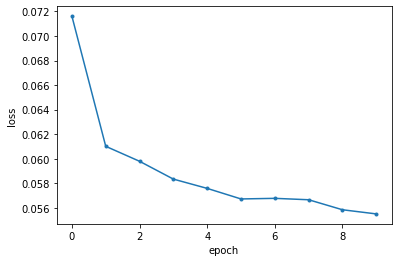

In [23]:
import matplotlib.pyplot as plt

def plot_history(hist, loss_name='loss'):
    # Simple function to plot training history.
    plt.figure()
    plt.plot(hist.epoch, hist.history[loss_name], '.-')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

plot_history(hist)

### Registration

Dice Similarity: 0.4226350784301758


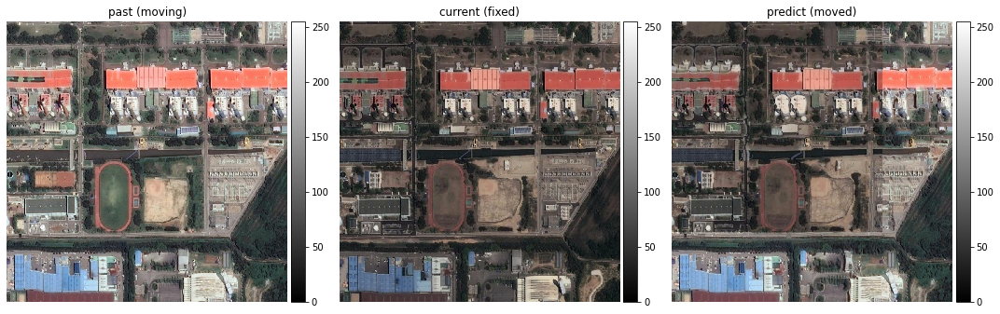


Dice Similarity: 0.34841057658195496


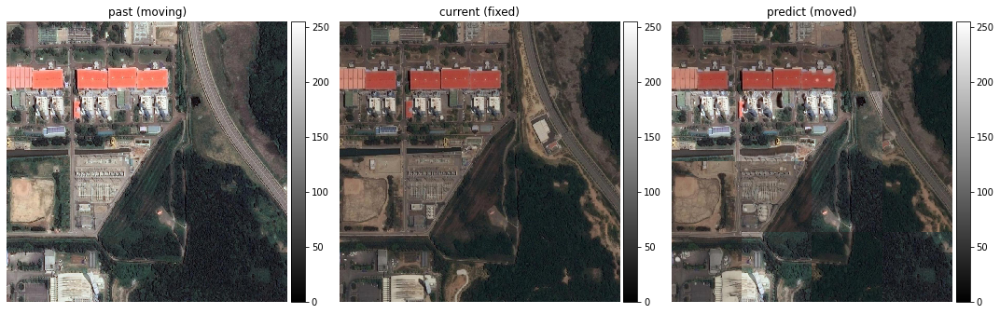


Dice Similarity: 0.3796211779117584


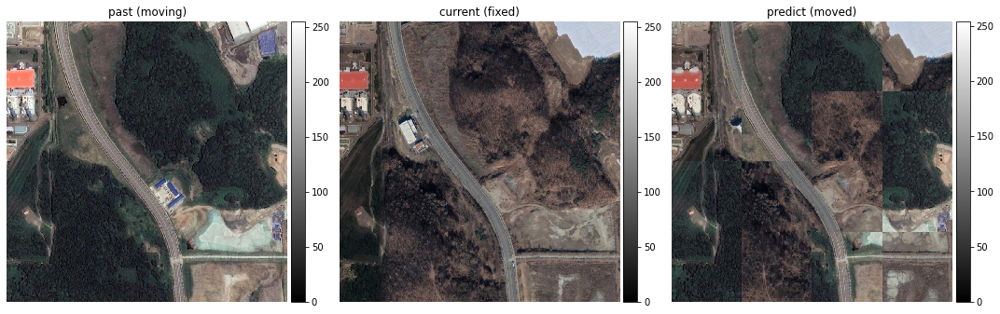


Dice Similarity: 0.3743714392185211


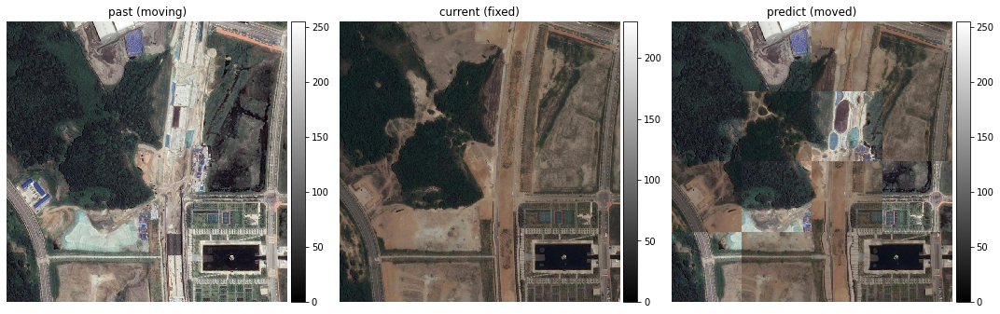


Dice Similarity: 0.4490407705307007


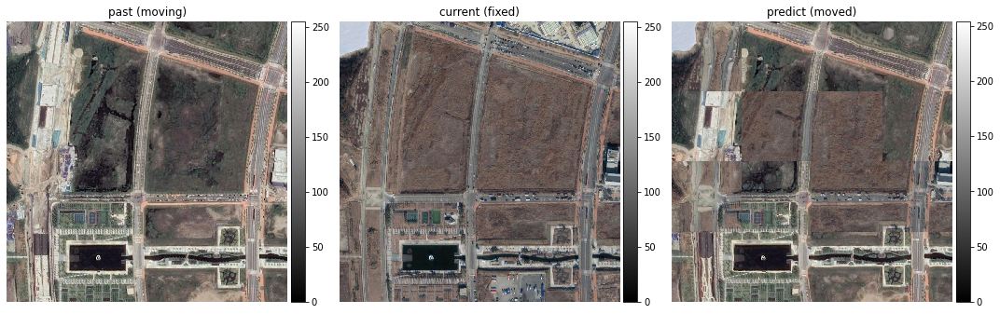


Dice Similarity: 0.37784603238105774


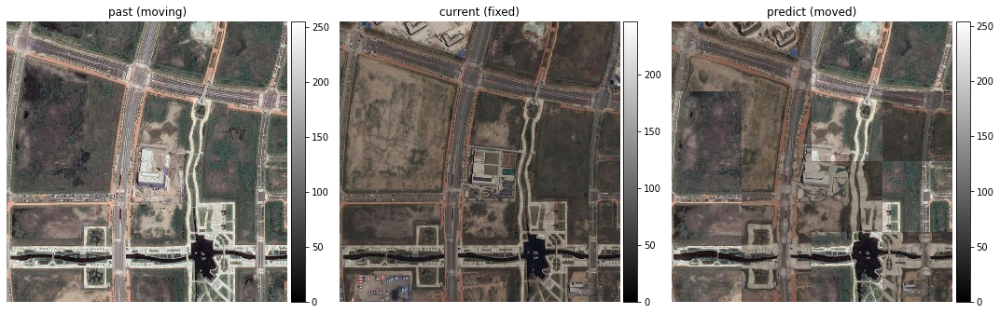


Dice Similarity: 0.4385121166706085


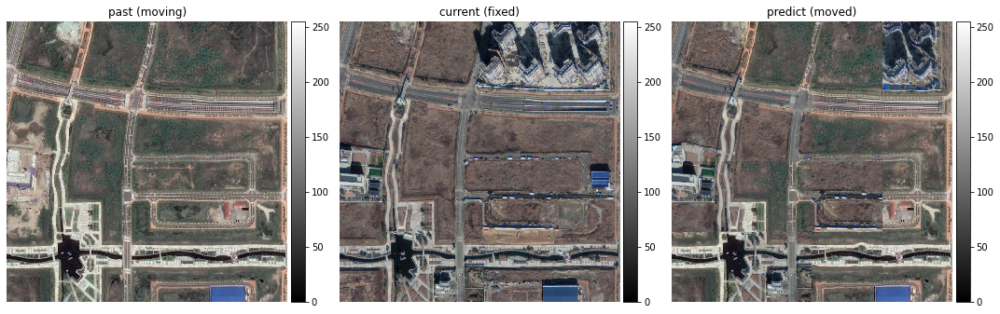


Dice Similarity: 0.3639640808105469


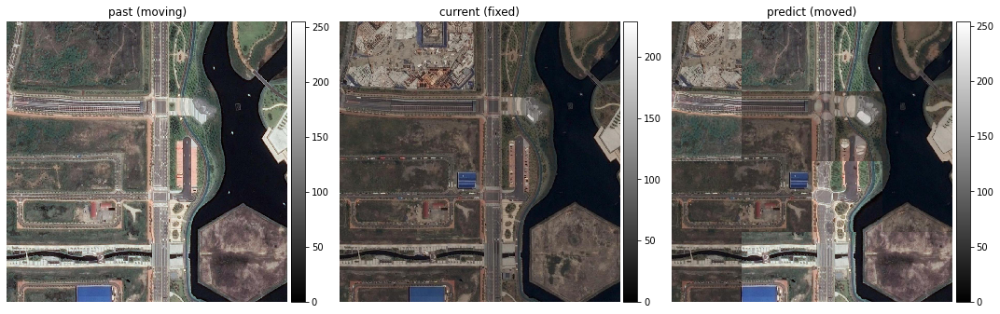


Dice Similarity: 0.438235342502594


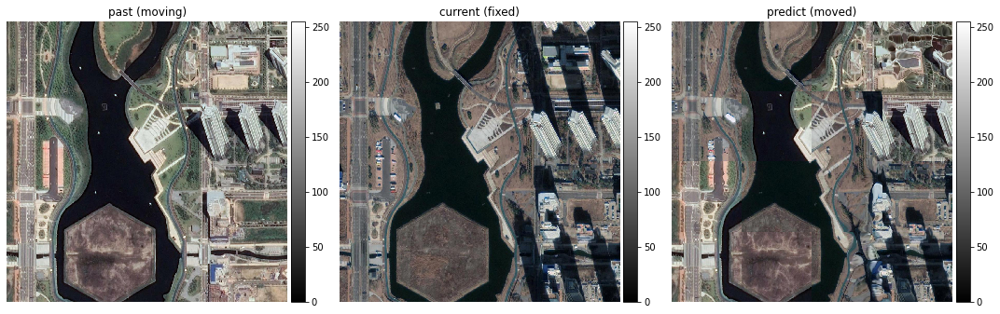


Dice Similarity: 0.3996519446372986


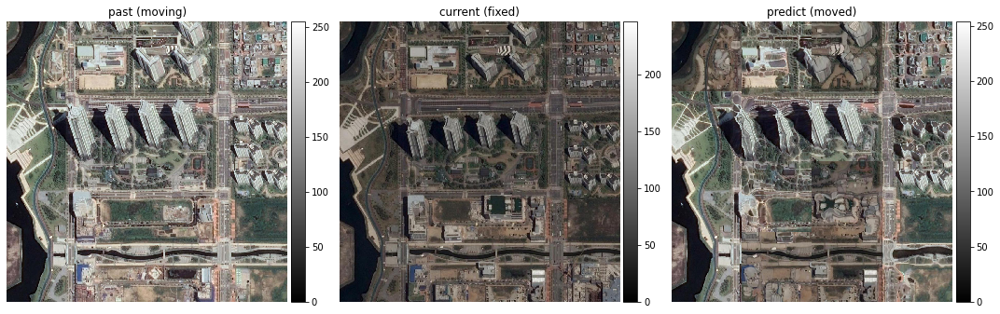

In [56]:
count = 0
for filename in past_dataset.namelist():
  if filename.startswith("Val/") and filename != "Val/":
    val_moving_images = []
    val_fixed_images = []
    patches_moved = []
    
    # past (moving)
    val_image_moving = Image.open(io.BytesIO(past_dataset.read(filename)))
    val_image_moving.thumbnail(size, Image.ANTIALIAS)
    patches_moving = patchify(np.array(val_image_moving), (256, 256, 3), step=256)

    # plot_image(val_image_moving, "past (moving)")

    # current (fixed)
    val_image_fixed = Image.open(io.BytesIO(current_dataset.read(filename)))
    val_image_fixed.thumbnail(size, Image.ANTIALIAS)
    patches_fixed = patchify(np.array(val_image_fixed), (256, 256, 3), step=256)
    
    # plot_image(val_image_fixed, "current (fixed)")

    for i in range(patches_moving.shape[0]):
      for j in range(patches_moving.shape[1]):
        single_patch_moving = patches_moving[i,j,:,:]
        single_patch_fixed = patches_fixed[i,j,:,:]

        np.savez("val.npz", val=[single_patch_moving[0], single_patch_fixed[0]])
        val = np.load('val.npz')
        x_val = val['val']
        # fix data
        x_val = x_val.astype('float')/255
        with tf.device(device):
          # let's get some data
          val_generator = vxm_data_generator(x_val, batch_size = 1)
          val_input, _ = next(val_generator)
          # predict warp and time
          start = time.time()
          val_pred = vxm_model.predict(val_input)
          reg_time = time.time() - start

          # visualize colored
          moving_colored = val_input[0][0]
          fixed_colored = val_input[1][0]
          moved_colored = val_pred[0][0]
          flow = [img[:, :, 0] for img in val_pred[1]]
          # titles = ['moving', 'fixed', 'moved', 'flow']

          # plot
          # images = [moving_colored, fixed_colored, moved_colored, flow]
          # ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
          # ne.plot.flow([val_pred[1].squeeze()], width=3);

          # compute volume overlap (dice)
          # overlap = dice_coef(fixed_colored, moved_colored)
          # print('Reg Time: %.4f' % reg_time)
          # print ("Dice Similarity: {}".format(overlap))
          # # print('Dice: %.4f +/- %.4f' % (np.mean(overlap), np.std(overlap)))

          patches_moved.append(np.expand_dims(moved_colored, axis=0))

    patches_moved = (np.array(patches_moved)*255).astype(np.uint8)
    patches_moved = np.reshape(patches_moved, 
                               (patches_fixed.shape[0], 
                                patches_fixed.shape[1], 
                                patches_fixed.shape[2], 
                                patches_fixed.shape[3], 
                                patches_fixed.shape[4], 
                                patches_fixed.shape[5]))
    moved_unpatchify = unpatchify(patches_moved, np.array(val_image_fixed).shape)
    # plot_image(moved_unpatchify, "predict (moved)")

    # save predict image
    im = Image.fromarray(moved_unpatchify).convert('RGB')
    im.save("moved_unpatchify.jpeg")

    # compute volume overlap (dice)
    overlap = dice_coef(np.array(val_image_fixed).astype('float')/255, np.array(moved_unpatchify).astype('float')/255)
    print ("Dice Similarity: {}".format(overlap))

    # plot
    titles = ['past (moving)', 'current (fixed)', 'predict (moved)']
    images = [val_image_moving, val_image_fixed, moved_unpatchify]
    ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);
    print()

    count=count+1

  if count >=10:
    break